# Apply LDA to OSHA

In [ ]:
#Install packages 
#!pip install pyldavis

In [ ]:
data_path = "own_path"
data_file_lst = os.listdir(data_path)

In [ ]:
print("data_file_lst: {}".format(data_file_lst))

data_file_lst: ['osha 4470_with_additional_metadata.xlsx']


In [ ]:
import pandas as pd
df = pd.read_excel(data_path+'osha 4470_with_additional_metadata.xlsx')
print(len(df))

4470


In [ ]:
df.head()

,id,title,SUMMARY,industry,diagnosis,occupation,1st occupation,fall dist,cause,fatcause
0,200361855,Two Workers Are Struck By Motor Vehicle And O...,On August 27 2013 Employees #1 and #2 of T...,1623,",Other,Other",",Occupation not reported,Occupation not reported",Occupation not reported,-1,Traffic protection,Other
1,202673471,Foreman Is Fatally Crushed When Forklift Tips...,At approximately 6:30 a.m. on May 13 2013 E...,1791,",Fracture",",Supervisors, material moving equipment operators",Supervisors,-1,[],[]
2,202509832,Employee Suffers Abdominal Fracture In Fall F...,On April 9 2013 Employee #1 was installing ...,1521,",Fracture",",Carpenters",Carpenters,8,Exterior carpentry,Fall from/with ladder
3,201562840,Employee'S Body Is Caught In Asphalt Machine ...,On November 27 2012 Employee #1 was operati...,1611,",Amputation",",Construction laborers",Construction laborers,-1,Excavation,Crushed/run
4,202478632,Employee Is Punctured In Abdomen With Nail,At approximately 11:57 a.m. on September 28 ...,1761,",Puncture",",Occupation not reported",Occupation not reported,-1,Roofing,Other


In [ ]:
df.dropna(subset=['title', 'SUMMARY'])

,id,title,SUMMARY,industry,diagnosis,occupation,1st occupation,fall dist,cause,fatcause
0,200361855,Two Workers Are Struck By Motor Vehicle And O...,On August 27 2013 Employees #1 and #2 of T...,1623,",Other,Other",",Occupation not reported,Occupation not reported",Occupation not reported,-1,Traffic protection,Other
1,202673471,Foreman Is Fatally Crushed When Forklift Tips...,At approximately 6:30 a.m. on May 13 2013 E...,1791,",Fracture",",Supervisors, material moving equipment operators",Supervisors,-1,[],[]
2,202509832,Employee Suffers Abdominal Fracture In Fall F...,On April 9 2013 Employee #1 was installing ...,1521,",Fracture",",Carpenters",Carpenters,8,Exterior carpentry,Fall from/with ladder
3,201562840,Employee'S Body Is Caught In Asphalt Machine ...,On November 27 2012 Employee #1 was operati...,1611,",Amputation",",Construction laborers",Construction laborers,-1,Excavation,Crushed/run
4,202478632,Employee Is Punctured In Abdomen With Nail,At approximately 11:57 a.m. on September 28 ...,1761,",Puncture",",Occupation not reported",Occupation not reported,-1,Roofing,Other
...,...,...,...,...,...,...,...,...,...,...
4465,200361509,Employee Is Injured In Fall From Second Story...,On February 1 2013 an employee was on secon...,1751,",Fracture",",Carpenters",Carpenters,19,Interior carpentry,Fall from/with scaffold
4466,202523742,Employee Fractures Foot In Fall From Roof,On January 31 2013 an employee was up on a ...,1521,",Fracture",",Construction laborers",Construction laborers,20,[],Fall from roof
4467,170180202,Employee Injured In 15 Ft Fall From Beam,Employee #1 was working on the demolition of ...,1795,",Fracture",",Construction trades, n.e.c.",Construction trades,-1,[],[]
4468,14458012,Struck By Falling Wrecking Bar,ON 10-04-84 AT APPROX. 10:15 A.M. THE OWNER ...,1761,",Other",",Helpers, construction trades",Helpers,-1,[],[]


In [ ]:
print(len(df))

4470


In [ ]:
df.head(5)

,id,title,SUMMARY,industry,diagnosis,occupation,1st occupation,fall dist,cause,fatcause
0,200361855,Two Workers Are Struck By Motor Vehicle And O...,On August 27 2013 Employees #1 and #2 of T...,1623,",Other,Other",",Occupation not reported,Occupation not reported",Occupation not reported,-1,Traffic protection,Other
1,202673471,Foreman Is Fatally Crushed When Forklift Tips...,At approximately 6:30 a.m. on May 13 2013 E...,1791,",Fracture",",Supervisors, material moving equipment operators",Supervisors,-1,[],[]
2,202509832,Employee Suffers Abdominal Fracture In Fall F...,On April 9 2013 Employee #1 was installing ...,1521,",Fracture",",Carpenters",Carpenters,8,Exterior carpentry,Fall from/with ladder
3,201562840,Employee'S Body Is Caught In Asphalt Machine ...,On November 27 2012 Employee #1 was operati...,1611,",Amputation",",Construction laborers",Construction laborers,-1,Excavation,Crushed/run
4,202478632,Employee Is Punctured In Abdomen With Nail,At approximately 11:57 a.m. on September 28 ...,1761,",Puncture",",Occupation not reported",Occupation not reported,-1,Roofing,Other


In [ ]:
title = df['title']
summary = df['SUMMARY']

In [ ]:
title.head()

0     Two Workers Are Struck By Motor Vehicle And O...
1     Foreman Is Fatally Crushed When Forklift Tips...
2     Employee Suffers Abdominal Fracture In Fall F...
3     Employee'S Body Is Caught In Asphalt Machine ...
4          Employee Is Punctured In Abdomen With Nail 
Name: title, dtype: object

In [ ]:
summary.head()

0     On August 27  2013  Employees #1 and #2  of T...
1     At approximately 6:30 a.m. on May 13  2013  E...
2     On April 9  2013  Employee #1 was installing ...
3     On November 27  2012  Employee #1 was operati...
4     At approximately 11:57 a.m. on September 28  ...
Name: SUMMARY, dtype: object

## Preprocessing: Remove punctuation, lower alphabet

### About Title

In [ ]:
import re
title = title.apply(lambda x: x.strip())
# Remove punctuation
title = title.apply(lambda x: re.sub('[.,\!]', '', str(x)))
# Lower the letter
title = title.apply(lambda x: x.lower())
title.head()

0    two workers are struck by motor vehicle and on...
1    foreman is fatally crushed when forklift tips ...
2    employee suffers abdominal fracture in fall fr...
3    employee's body is caught in asphalt machine  ...
4           employee is punctured in abdomen with nail
Name: title, dtype: object

### About Summary

In [ ]:
import re
summary = summary.apply(lambda x: x.strip())
# Remove punctuation
summary = summary.apply(lambda x: re.sub('[.,\!]', '', str(x)))
# Lower the letter
summary = summary.apply(lambda x: x.lower())
summary.head()

<input>:4: DeprecationWarning: invalid escape sequence \!
<input>:4: DeprecationWarning: invalid escape sequence \!
<input>:4: DeprecationWarning: invalid escape sequence \!
<input>:4: DeprecationWarning: invalid escape sequence \!
<ipython-input-155-601fa10e89c6>:4: DeprecationWarning: invalid escape sequence \!
  summary = summary.apply(lambda x: re.sub('[.,\!]', '', str(x)))


0    on august 27  2013  employees #1 and #2  of te...
1    at approximately 6:30 am on may 13  2013  empl...
2    on april 9  2013  employee #1 was installing v...
3    on november 27  2012  employee #1 was operatin...
4    at approximately 11:57 am on september 28  201...
Name: SUMMARY, dtype: object

## Word Cloud - Visualization

#### About Title

In [ ]:
title_combined_string = ','.join(list(title.values))
title_combined_string

"two workers are struck by motor vehicle and one is killed,foreman is fatally crushed when forklift tips over,employee suffers abdominal fracture in fall from ladder,employee's body is caught in asphalt machine  dies,employee is punctured in abdomen with nail,carpenter is injured in fall from ceiling joist,pipeline worker is struck and injured by falling cement,employee crushes leg  suffers possible fracture,worker falls from roof and breaks arm,driver hurt when truck unloading sand overturns,tile setter sustains injuries in fall from ladder,crane operator incurs knee injury when crane tips over,employee is killed in fall from suspension scaffold,employee killed in fall from man lift,employee killed in fall from roof,employee's thigh lacerated with abrasive from machine,asphyxiated in rail car; air compressor failed,employee killed in fall from telecommunications tower,worker is struck by abrasive disk from concrete machine,worker lacerates hand on angle grinder used on concrete,abrasi

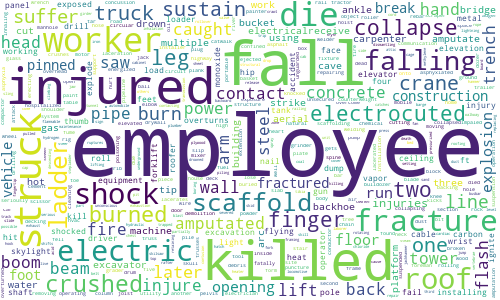

In [ ]:
from wordcloud import WordCloud
# Combine 'title' sentence into one string
title_combined_string = ','.join(list(title.values))
# Create a word cloud object
title_wordcloud = WordCloud(width=500,height=300,max_words=10000, contour_width=2, background_color="white", collocations=False)
# Word cloud generation
title_wordcloud.generate(title_combined_string)
# Visualize the word cloud
title_wordcloud.to_image()

#### About Summary

In [ ]:
summary_combined_string = ','.join(list(summary.values))
summary_combined_string

' on august 27  2013  employees #1 and #2  of templar inc  a construction  company specializing in fiber optic installation and services  were working  along a highway the highway speed limit was posted at 55 miles per hour  employee #1 was marking the location of an underground line that ran below the  turn lane employee #2 was next to employee #1 and performing the duties of a  flagger a privately owned vehicle was travelling in the travel/through lane  the vehicle veered to the right  entered the turn lane  and struck both  workers emergency medical services were called employee #1 was declared dead  at the scene employee #2 refused emergency medical treatment for the bruises  he received when struck                                                        , at approximately 6:30 am on may 13  2013  employee #1  a foreman regularly  employed by integrity rebar placers  was operating a rough terrain forklift at  a contracted job site in murrieta  ca he was using the forklift to move  b

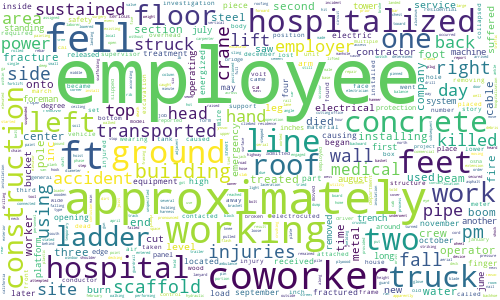

In [ ]:
# Combine 'summary' sentence into one string
summary_combined_string = ','.join(list(summary.values))
# Create a word cloud object
summary_wordcloud = WordCloud(width=500,height=300,max_words=10000, contour_width=2, background_color="white", collocations=False)
# Word cloud generation
summary_wordcloud.generate(summary_combined_string)
# Visualize the word cloud
summary_wordcloud.to_image()

## LDA

### About Title

In [ ]:
import nltk

In [ ]:
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
import gensim
from gensim.utils import simple_preprocess

In [ ]:
stop_words = stopwords.words('english')
extend_lst = ['from', '']

stop_words.extend(extend_lst)
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
title_tolist = title.tolist()
title_tolist

['two workers are struck by motor vehicle and one is killed',
 'foreman is fatally crushed when forklift tips over',
 'employee suffers abdominal fracture in fall from ladder',
 "employee's body is caught in asphalt machine  dies",
 'employee is punctured in abdomen with nail',
 'carpenter is injured in fall from ceiling joist',
 'pipeline worker is struck and injured by falling cement',
 'employee crushes leg  suffers possible fracture',
 'worker falls from roof and breaks arm',
 'driver hurt when truck unloading sand overturns',
 'tile setter sustains injuries in fall from ladder',
 'crane operator incurs knee injury when crane tips over',
 'employee is killed in fall from suspension scaffold',
 'employee killed in fall from man lift',
 'employee killed in fall from roof',
 "employee's thigh lacerated with abrasive from machine",
 'asphyxiated in rail car; air compressor failed',
 'employee killed in fall from telecommunications tower',
 'worker is struck by abrasive disk from concre

In [ ]:
title_to_wordlist = []

## Remove Stopwords & Blank
for i in range(len(title_tolist)):
  sent = title_tolist[i]
  empty_lst = []
  for word in sent.split(" "): 
    if word != stop_words:
      empty_lst.append(word)
  
  title_to_wordlist.append(empty_lst)

title_to_wordlist

[['two',
  'workers',
  'are',
  'struck',
  'by',
  'motor',
  'vehicle',
  'and',
  'one',
  'is',
  'killed'],
 ['foreman', 'is', 'fatally', 'crushed', 'when', 'forklift', 'tips', 'over'],
 ['employee',
  'suffers',
  'abdominal',
  'fracture',
  'in',
  'fall',
  'from',
  'ladder'],
 ["employee's",
  'body',
  'is',
  'caught',
  'in',
  'asphalt',
  'machine',
  '',
  'dies'],
 ['employee', 'is', 'punctured', 'in', 'abdomen', 'with', 'nail'],
 ['carpenter', 'is', 'injured', 'in', 'fall', 'from', 'ceiling', 'joist'],
 ['pipeline',
  'worker',
  'is',
  'struck',
  'and',
  'injured',
  'by',
  'falling',
  'cement'],
 ['employee', 'crushes', 'leg', '', 'suffers', 'possible', 'fracture'],
 ['worker', 'falls', 'from', 'roof', 'and', 'breaks', 'arm'],
 ['driver', 'hurt', 'when', 'truck', 'unloading', 'sand', 'overturns'],
 ['tile', 'setter', 'sustains', 'injuries', 'in', 'fall', 'from', 'ladder'],
 ['crane',
  'operator',
  'incurs',
  'knee',
  'injury',
  'when',
  'crane',
  'tips

In [ ]:
print(title_to_wordlist[:1])

[['two', 'workers', 'are', 'struck', 'by', 'motor', 'vehicle', 'and', 'one', 'is', 'killed']]
['two', 'workers', 'are', 'struck', 'by', 'motor', 'vehicle', 'and', 'one', 'is', 'killed']


In [ ]:
import gensim.corpora as corpora
# Create Dictionary
title_id2word = corpora.Dictionary(title_to_wordlist)
# Create Corpus
title_texts = title_to_wordlist
# Term Document Frequency
title_corpus = [title_id2word.doc2bow(text) for text in title_texts]
# View
print(title_corpus[:1][0])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1)]


In [ ]:
print(title_corpus[:5])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1)], [(3, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1)], [(18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1)], [(3, 1), (23, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1)], [(3, 1), (19, 1), (23, 1), (33, 1), (34, 1), (35, 1), (36, 1)]]


In [ ]:
from pprint import pprint
# number of topics
num_topics = 12
# Build LDA model
title_lda_model = gensim.models.LdaMulticore(corpus=title_corpus,
                                       id2word=title_id2word,
                                       num_topics=num_topics)

# Print the Keyword in the 10 topics
pprint(title_lda_model.print_topics())
title_doc_lda = title_lda_model[title_corpus]

[(0,
  '0.056*"is" + 0.031*"worker" + 0.030*"employee" + 0.030*"injured" + '
  '0.028*"in" + 0.025*"when" + 0.024*"" + 0.022*"falls" + 0.022*"and" + '
  '0.020*"by"'),
 (1,
  '0.091*"employee" + 0.066*"is" + 0.065*"killed" + 0.062*"in" + 0.051*"from" '
  '+ 0.043*"fall" + 0.027*"when" + 0.027*"by" + 0.019*"and" + 0.018*"injured"'),
 (2,
  '0.100*"employee" + 0.053*"is" + 0.046*"in" + 0.039*"killed" + 0.036*"by" + '
  '0.035*"fall" + 0.027*"injured" + 0.025*"from" + 0.024*"and" + 0.019*"dies"'),
 (3,
  '0.063*"electric" + 0.062*"shock" + 0.043*"employees" + 0.038*"employee" + '
  '0.031*"two" + 0.024*"injured" + 0.023*"from" + 0.021*"when" + 0.018*"while" '
  '+ 0.017*"are"'),
 (4,
  '0.080*"employee" + 0.069*"when" + 0.038*"injured" + 0.037*"in" + 0.019*"is" '
  '+ 0.017*"caught" + 0.017*"by" + 0.015*"worker" + 0.015*"and" + '
  '0.013*"falls"'),
 (5,
  '0.071*"employee" + 0.064*"is" + 0.056*"in" + 0.053*"by" + 0.046*"fall" + '
  '0.041*"when" + 0.041*"injured" + 0.033*"from" + 0.031*"

### About summary

In [ ]:
summary_tolist = summary.tolist()
summary_tolist

['on august 27  2013  employees #1 and #2  of templar inc  a construction  company specializing in fiber optic installation and services  were working  along a highway the highway speed limit was posted at 55 miles per hour  employee #1 was marking the location of an underground line that ran below the  turn lane employee #2 was next to employee #1 and performing the duties of a  flagger a privately owned vehicle was travelling in the travel/through lane  the vehicle veered to the right  entered the turn lane  and struck both  workers emergency medical services were called employee #1 was declared dead  at the scene employee #2 refused emergency medical treatment for the bruises  he received when struck',
 'at approximately 6:30 am on may 13  2013  employee #1  a foreman regularly  employed by integrity rebar placers  was operating a rough terrain forklift at  a contracted job site in murrieta  ca he was using the forklift to move  bundles of steel employee #1 was positioning the forkl

In [ ]:
summary_to_wordlist = []

## Remove Stopwords & Blank
for i in range(len(summary_tolist)):
  sent = summary_tolist[i]
  empty_lst = []
  for word in sent.split(" "): 
    if (word != stop_words) and (word !="") :
      empty_lst.append(word)
  
  summary_to_wordlist.append(empty_lst)

summary_to_wordlist

[['on',
  'august',
  '27',
  '2013',
  'employees',
  '#1',
  'and',
  '#2',
  'of',
  'templar',
  'inc',
  'a',
  'construction',
  'company',
  'specializing',
  'in',
  'fiber',
  'optic',
  'installation',
  'and',
  'services',
  'were',
  'working',
  'along',
  'a',
  'highway',
  'the',
  'highway',
  'speed',
  'limit',
  'was',
  'posted',
  'at',
  '55',
  'miles',
  'per',
  'hour',
  'employee',
  '#1',
  'was',
  'marking',
  'the',
  'location',
  'of',
  'an',
  'underground',
  'line',
  'that',
  'ran',
  'below',
  'the',
  'turn',
  'lane',
  'employee',
  '#2',
  'was',
  'next',
  'to',
  'employee',
  '#1',
  'and',
  'performing',
  'the',
  'duties',
  'of',
  'a',
  'flagger',
  'a',
  'privately',
  'owned',
  'vehicle',
  'was',
  'travelling',
  'in',
  'the',
  'travel/through',
  'lane',
  'the',
  'vehicle',
  'veered',
  'to',
  'the',
  'right',
  'entered',
  'the',
  'turn',
  'lane',
  'and',
  'struck',
  'both',
  'workers',
  'emergency',
  'me

In [ ]:
print(summary_to_wordlist[:1])

[['on', 'august', '27', '2013', 'employees', '#1', 'and', '#2', 'of', 'templar', 'inc', 'a', 'construction', 'company', 'specializing', 'in', 'fiber', 'optic', 'installation', 'and', 'services', 'were', 'working', 'along', 'a', 'highway', 'the', 'highway', 'speed', 'limit', 'was', 'posted', 'at', '55', 'miles', 'per', 'hour', 'employee', '#1', 'was', 'marking', 'the', 'location', 'of', 'an', 'underground', 'line', 'that', 'ran', 'below', 'the', 'turn', 'lane', 'employee', '#2', 'was', 'next', 'to', 'employee', '#1', 'and', 'performing', 'the', 'duties', 'of', 'a', 'flagger', 'a', 'privately', 'owned', 'vehicle', 'was', 'travelling', 'in', 'the', 'travel/through', 'lane', 'the', 'vehicle', 'veered', 'to', 'the', 'right', 'entered', 'the', 'turn', 'lane', 'and', 'struck', 'both', 'workers', 'emergency', 'medical', 'services', 'were', 'called', 'employee', '#1', 'was', 'declared', 'dead', 'at', 'the', 'scene', 'employee', '#2', 'refused', 'emergency', 'medical', 'treatment', 'for', 'the',

In [ ]:
# Create Dictionary
summary_id2word = corpora.Dictionary(summary_to_wordlist)
# Create Corpus
summary_texts = summary_to_wordlist
# Term Document Frequency
summary_corpus = [summary_id2word.doc2bow(text) for text in summary_texts]
# View
print(summary_corpus[:1][0])

[(0, 4), (1, 3), (2, 1), (3, 1), (4, 1), (5, 4), (6, 1), (7, 1), (8, 4), (9, 2), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 2), (21, 5), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 2), (29, 1), (30, 2), (31, 1), (32, 1), (33, 3), (34, 1), (35, 1), (36, 1), (37, 1), (38, 2), (39, 1), (40, 1), (41, 3), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 2), (55, 1), (56, 1), (57, 2), (58, 1), (59, 1), (60, 10), (61, 2), (62, 1), (63, 1), (64, 1), (65, 2), (66, 1), (67, 1), (68, 2), (69, 5), (70, 2), (71, 1), (72, 1), (73, 1)]


In [ ]:
print(summary_corpus[:5])

[[(0, 4), (1, 3), (2, 1), (3, 1), (4, 1), (5, 4), (6, 1), (7, 1), (8, 4), (9, 2), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 2), (21, 5), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 2), (29, 1), (30, 2), (31, 1), (32, 1), (33, 3), (34, 1), (35, 1), (36, 1), (37, 1), (38, 2), (39, 1), (40, 1), (41, 3), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 2), (55, 1), (56, 1), (57, 2), (58, 1), (59, 1), (60, 10), (61, 2), (62, 1), (63, 1), (64, 1), (65, 2), (66, 1), (67, 1), (68, 2), (69, 5), (70, 2), (71, 1), (72, 1), (73, 1)], [(0, 5), (2, 2), (5, 3), (8, 2), (9, 3), (15, 1), (21, 5), (26, 1), (27, 2), (30, 1), (41, 5), (42, 3), (59, 1), (60, 12), (61, 2), (69, 4), (71, 1), (74, 2), (75, 1), (76, 1), (77, 1), (78, 1), (79, 2), (80, 1), (81, 3), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 2), (88, 1), (89, 1), (90, 1), (91, 1), (92, 1), (93, 1), (94, 2), (

In [ ]:
from pprint import pprint
# number of topics
topic_num = 12
# Build LDA model
summary_lda_model = gensim.models.LdaMulticore(corpus=summary_corpus,
                                       id2word=summary_id2word,
                                       num_topics=topic_num)

# Print the Keyword in the 10 topics
pprint(summary_lda_model.print_topics())
summary_doc_lda = summary_lda_model[summary_corpus]

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

[(0,
  '0.060*"the" + 0.034*"to" + 0.034*"and" + 0.033*"a" + 0.028*"of" + '
  '0.028*"employee" + 0.025*"was" + 0.025*"on" + 0.021*"he" + 0.017*"#1"'),
 (1,
  '0.103*"the" + 0.038*"and" + 0.035*"was" + 0.030*"employee" + 0.029*"a" + '
  '0.025*"to" + 0.024*"#1" + 0.019*"of" + 0.014*"in" + 0.013*"on"'),
 (2,
  '0.060*"the" + 0.035*"and" + 0.032*"a" + 0.032*"was" + 0.030*"of" + '
  '0.026*"on" + 0.026*"employee" + 0.022*"#1" + 0.021*"to" + 0.019*"he"'),
 (3,
  '0.061*"the" + 0.044*"a" + 0.033*"was" + 0.032*"of" + 0.024*"employee" + '
  '0.024*"on" + 0.021*"and" + 0.015*"to" + 0.015*"he" + 0.013*"#1"'),
 (4,
  '0.054*"the" + 0.031*"a" + 0.025*"was" + 0.024*"to" + 0.023*"of" + '
  '0.021*"#1" + 0.020*"on" + 0.020*"employee" + 0.018*"he" + 0.016*"and"'),
 (5,
  '0.089*"the" + 0.040*"was" + 0.034*"a" + 0.031*"to" + 0.029*"employee" + '
  '0.026*"of" + 0.021*"#1" + 0.018*"on" + 0.018*"and" + 0.014*"he"'),
 (6,
  '0.080*"the" + 0.035*"a" + 0.032*"and" + 0.032*"of" + 0.029*"to" + '
  '0.029*"#1

## Visualize LDA results - with pyLDAvis

### About Title

In [ ]:
!pip install pyLDAvis

     |████████████████████████████████| 1.7 MB 5.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 11.3 MB 41.8 MB/s 
     |████████████████████████████████| 15.7 MB 27.0 MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136897 sha256=39155e37ab378e3ce2722480bc9f88c28e6666cf3b273179f05e40c0e81696a2
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: pandas
    Found existing installation: pandas 1.1.5
    Uninstalling pandas-1.1.5:
      Successfully uninstalled pandas-1.1.5
ERROR: pip's dependency resolver does not currently take in

In [ ]:
!pip install --upgrade pandas==1.2

     |████████████████████████████████| 9.9 MB 5.1 MB/s 
  Attempting uninstall: pandas
    Found existing installation: pandas 1.3.4
    Uninstalling pandas-1.3.4:
      Successfully uninstalled pandas-1.3.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 1.2.0 which is incompatible.


In [ ]:
#https://stackoverflow.com/questions/66759852/no-module-named-pyldavis
import pyLDAvis.gensim_models
import pickle 
import pyLDAvis

save_paht_for_title = "own_path"
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join(save_paht_for_title+str(topic_num))
# visualization
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(title_lda_model, title_corpus, title_id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, save_paht_for_title+ str(topic_num) +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
10     0.055420  0.022912       1        1  14.228494
3      0.066841  0.077883       2        1  13.000783
4      0.047536 -0.020732       3        1  12.656070
0     -0.035012 -0.060168       4        1  10.334275
9      0.047901  0.039764       5        1   8.512061
6      0.007493 -0.055939       6        1   7.518224
1     -0.048468 -0.023992       7        1   7.163069
5      0.020701 -0.015735       8        1   6.681111
8      0.034960  0.023732       9        1   5.967294
2      0.020795  0.007787      10        1   5.482200
11    -0.039978 -0.073156      11        1   4.669545
7     -0.178190  0.077645      12        1   3.786874, topic_info=          Term         Freq        Total Category  logprob  loglift
188      shock   307.000000   307.000000  Default  30.0000  30.0000
186   electric   305.000000   305.000000  Default  29.0000  29.0000
4       killed  1056.000000  1056.000000  Default  28.0000  28.0000
39     injured   888.000000   888.000000  Default  27.0000  27.0000
20        fall  1016.000000  1016.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
8          two     5.745142   147.864003  Topic12  -5.3567   0.0257
221    through     5.620479   144.163546  Topic12  -5.3786   0.0291
39     injured     6.727824   888.130130  Topic12  -5.1988  -1.6092
139  fractures     5.781259   278.429489  Topic12  -5.3504  -0.6009
50       falls     4.653056   381.477565  Topic12  -5.5675  -1.1329

[948 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
26        1  0.130525          
26        2  0.037784          
26        3  0.137395          
26        4  0.096176          
26        5  0.017174          
...     ...       ...       ...
201      10  0.032823   working
201      11  0.098468   working
1550      8  0.801767  wrecking
1594      6  0.531209      yoke
632       7  0.491688     young

[2223 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 4, 5, 1, 10, 7, 2, 6, 9, 3, 12, 8])

### About Summary

In [ ]:
save_paht_for_summary = "own_path"
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join(save_paht_for_summary+str(topic_num))
# visualization
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(summary_lda_model, summary_corpus, summary_id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, save_paht_for_summary+ str(topic_num) +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.045164  0.002620       1        1  39.157731
11    -0.046164  0.008315       2        1  21.326253
5     -0.034797  0.005856       3        1  12.054768
0     -0.029246  0.000111       4        1   8.159088
6     -0.025775  0.000955       5        1   6.616735
8     -0.019805 -0.024385       6        1   4.955460
2     -0.017877 -0.004024       7        1   3.926982
3     -0.004531  0.003709       8        1   1.873250
4      0.013020 -0.002727       9        1   0.780612
10     0.012606 -0.007806      10        1   0.732548
9      0.036317  0.019783      11        1   0.321516
7      0.161416 -0.002409      12        1   0.095057, topic_info=              Term          Freq         Total Category  logprob  loglift
60             the  45246.000000  45246.000000  Default  30.0000  30.0000
5                a  16743.000000  16743.000000  Default  29.0000  29.0000
69             was  17765.000000  17765.000000  Default  28.0000  28.0000
21        employee  14640.000000  14640.000000  Default  27.0000  27.0000
61              to  14097.000000  14097.000000  Default  26.0000  26.0000
..             ...           ...           ...      ...      ...      ...
526           they      0.799126    933.327540  Topic12  -6.4191  -0.1045
81   approximately      1.015810   2930.268865  Topic12  -6.1792  -1.0087
537             ft      0.821806   1618.055246  Topic12  -6.3911  -0.6268
22       employees      0.726001   1426.639236  Topic12  -6.5150  -0.6248
272            not      0.752263   1823.765484  Topic12  -6.4795  -0.8349

[908 rows x 6 columns], token_table=       Topic      Freq          Term
term                                
16400      8  0.760119  "all-thread"
14164      3  0.645613         "p-1"
12272      6  0.644884     "snooper"
0          1  0.423458            #1
0          2  0.178144            #1
...      ...       ...           ...
73         9  0.006317       working
73        10  0.005345       working
73        11  0.002915       working
73        12  0.000486       working
12201      1  0.469432            wv

[1843 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 12, 6, 1, 7, 9, 3, 4, 5, 11, 10, 8])

## Model Perplexity and Coherence Score

### About Title

In [ ]:
#Condition to find optimized topics 
start = 2
end = 20
interval = 1

In [ ]:
conherence_lst = []
perplexity_lst = [] 
model_lst = []

for topic_num in range(start,end,interval):
  temp_title_lda_model = gensim.models.LdaMulticore(corpus=title_corpus,
                                       id2word=title_id2word,
                                       num_topics=topic_num)

  model_lst.append(temp_title_lda_model)

  # coherence
  coherence_model_lda = CoherenceModel(model=temp_title_lda_model, texts=title_to_wordlist, dictionary=title_id2word, coherence='c_v')
  
  ### coherence score
  coherence_lda_value = coherence_model_lda.get_coherence()
  conherence_lst.append(coherence_lda_value)

  # perplexity
  ### coherence score
  perplexity_value = title_lda_model.log_perplexity(title_corpus)
  perplexity_lst.append(perplexity_value)



  

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

##### Coherence Graph

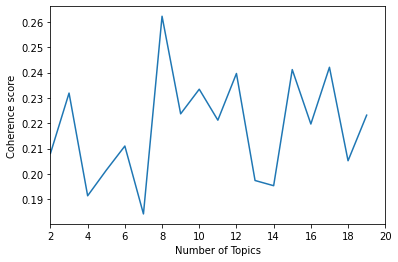

In [ ]:
## coherence graph
x_value = range(start,end,interval)

plt.plot(x_value,conherence_lst)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")

plt.xlim([2,20])
plt.show()

In [ ]:
for m, cv in zip(x_value,conherence_lst):
  print("Number of Topics = ",m, " has coherence value of", round(cv, 4))

Number of Topics =  2  has coherence value of 0.2081
Number of Topics =  3  has coherence value of 0.2319
Number of Topics =  4  has coherence value of 0.1913
Number of Topics =  5  has coherence value of 0.2014
Number of Topics =  6  has coherence value of 0.211
Number of Topics =  7  has coherence value of 0.1842
Number of Topics =  8  has coherence value of 0.2623
Number of Topics =  9  has coherence value of 0.2237
Number of Topics =  10  has coherence value of 0.2334
Number of Topics =  11  has coherence value of 0.2212
Number of Topics =  12  has coherence value of 0.2396
Number of Topics =  13  has coherence value of 0.1974
Number of Topics =  14  has coherence value of 0.1953
Number of Topics =  15  has coherence value of 0.2412
Number of Topics =  16  has coherence value of 0.2197
Number of Topics =  17  has coherence value of 0.2421
Number of Topics =  18  has coherence value of 0.2052
Number of Topics =  19  has coherence value of 0.2232


##### Perplexity Graph

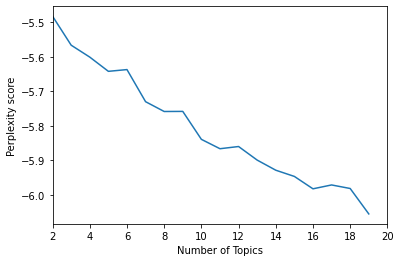

In [ ]:
## coherence graph
x_value = range(start,end,interval)

plt.plot(x_value,perplexity_lst)
plt.xlabel("Number of Topics")
plt.ylabel("Perplexity score")

plt.xlim([2,20])
plt.show()

In [ ]:
for m, cv in zip(x_value,perplexity_lst):
  print("Number of Topics = ",m, " has perplexity value of", round(cv, 4))

Number of Topics =  2  has perplexity value of -5.4827
Number of Topics =  3  has perplexity value of -5.5666
Number of Topics =  4  has perplexity value of -5.6012
Number of Topics =  5  has perplexity value of -5.6424
Number of Topics =  6  has perplexity value of -5.6373
Number of Topics =  7  has perplexity value of -5.7304
Number of Topics =  8  has perplexity value of -5.7588
Number of Topics =  9  has perplexity value of -5.7585
Number of Topics =  10  has perplexity value of -5.8395
Number of Topics =  11  has perplexity value of -5.8667
Number of Topics =  12  has perplexity value of -5.8603
Number of Topics =  13  has perplexity value of -5.8997
Number of Topics =  14  has perplexity value of -5.929
Number of Topics =  15  has perplexity value of -5.947
Number of Topics =  16  has perplexity value of -5.9829
Number of Topics =  17  has perplexity value of -5.9717
Number of Topics =  18  has perplexity value of -5.982
Number of Topics =  19  has perplexity value of -6.0557


### About Summary

In [ ]:
summary_conherence_lst = []
summary_perplexity_lst = [] 
summary_model_lst = []

for topic_num in range(start,end,interval):
  temp_summary_lda_model = gensim.models.LdaMulticore(corpus=summary_corpus,
                                       id2word=summary_id2word,
                                       num_topics=topic_num)

  summary_model_lst.append(temp_summary_lda_model)

  # coherence
  coherence_model_lda = CoherenceModel(model=temp_summary_lda_model, texts=summary_to_wordlist, dictionary=summary_id2word, coherence='c_v')
  
  ### coherence score
  coherence_lda_value = coherence_model_lda.get_coherence()
  summary_conherence_lst.append(coherence_lda_value)

  # perplexity
  ### coherence score
  perplexity_value = title_lda_model.log_perplexity(title_corpus)
  summary_perplexity_lst.append(perplexity_value)



  

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(El

##### Coherence Graph

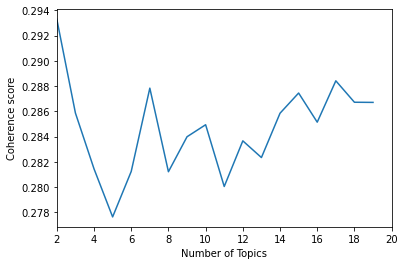

In [ ]:
## coherence graph
x_value = range(start,end,interval)

plt.plot(x_value,summary_conherence_lst)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")

plt.xlim([2,20])
plt.show()

In [ ]:
for m, cv in zip(x_value,summary_conherence_lst):
  print("Number of Topics = ",m, " has coherence value of", round(cv, 4))

Number of Topics =  2  has coherence value of 0.2933
Number of Topics =  3  has coherence value of 0.2859
Number of Topics =  4  has coherence value of 0.2814
Number of Topics =  5  has coherence value of 0.2776
Number of Topics =  6  has coherence value of 0.2812
Number of Topics =  7  has coherence value of 0.2878
Number of Topics =  8  has coherence value of 0.2812
Number of Topics =  9  has coherence value of 0.284
Number of Topics =  10  has coherence value of 0.2849
Number of Topics =  11  has coherence value of 0.28
Number of Topics =  12  has coherence value of 0.2837
Number of Topics =  13  has coherence value of 0.2823
Number of Topics =  14  has coherence value of 0.2858
Number of Topics =  15  has coherence value of 0.2875
Number of Topics =  16  has coherence value of 0.2851
Number of Topics =  17  has coherence value of 0.2884
Number of Topics =  18  has coherence value of 0.2867
Number of Topics =  19  has coherence value of 0.2867


##### Perplexity Graph

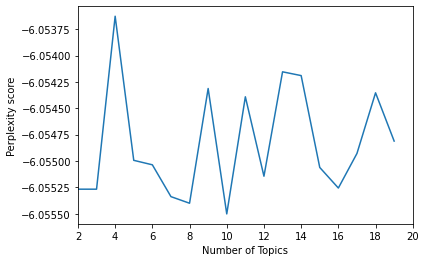

In [ ]:
## coherence graph
x_value = range(start,end,interval)

plt.plot(x_value,summary_perplexity_lst)
plt.xlabel("Number of Topics")
plt.ylabel("Perplexity score")

plt.xlim([2,20])
plt.show()

In [ ]:
for m, cv in zip(x_value,summary_perplexity_lst):
  print("Number of Topics = ",m, " has perplexity value of", round(cv, 4))

Number of Topics =  2  has perplexity value of -6.0553
Number of Topics =  3  has perplexity value of -6.0553
Number of Topics =  4  has perplexity value of -6.0536
Number of Topics =  5  has perplexity value of -6.055
Number of Topics =  6  has perplexity value of -6.055
Number of Topics =  7  has perplexity value of -6.0553
Number of Topics =  8  has perplexity value of -6.0554
Number of Topics =  9  has perplexity value of -6.0543
Number of Topics =  10  has perplexity value of -6.0555
Number of Topics =  11  has perplexity value of -6.0544
Number of Topics =  12  has perplexity value of -6.0551
Number of Topics =  13  has perplexity value of -6.0542
Number of Topics =  14  has perplexity value of -6.0542
Number of Topics =  15  has perplexity value of -6.0551
Number of Topics =  16  has perplexity value of -6.0553
Number of Topics =  17  has perplexity value of -6.0549
Number of Topics =  18  has perplexity value of -6.0544
Number of Topics =  19  has perplexity value of -6.0548


##Analyze with optimal model

### About Title

In [ ]:
### 여기서 index는 순서를 나타내네
optimal_model = model_lst[6]
topic_in_model = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.073*"employee" + 0.049*"in" + 0.025*"is" + 0.025*"by" + 0.024*"dies" + '
  '0.019*"roof" + 0.016*"from" + 0.016*"fall" + 0.015*"while" + '
  '0.015*"struck"'),
 (1,
  '0.070*"employee" + 0.051*"shock" + 0.050*"electric" + 0.048*"by" + '
  '0.046*"is" + 0.045*"when" + 0.044*"killed" + 0.023*"and" + 0.021*"crushed" '
  '+ 0.014*"over"'),
 (2,
  '0.096*"employee" + 0.063*"in" + 0.059*"from" + 0.051*"fall" + 0.042*"is" + '
  '0.039*"killed" + 0.033*"injured" + 0.029*"by" + 0.025*"when" + '
  '0.019*"fractures"'),
 (3,
  '0.064*"employee" + 0.048*"by" + 0.041*"is" + 0.038*"when" + 0.027*"dies" + '
  '0.025*"killed" + 0.022*"and" + 0.020*"electric" + 0.020*"shock" + '
  '0.017*"falls"'),
 (4,
  '0.061*"employee" + 0.052*"by" + 0.040*"in" + 0.037*"is" + 0.034*"killed" + '
  '0.032*"when" + 0.031*"injured" + 0.029*"fall" + 0.021*"struck" + '
  '0.017*"employees"'),
 (5,
  '0.120*"employee" + 0.062*"is" + 0.051*"in" + 0.044*"injured" + 0.038*"from" '
  '+ 0.038*"fall" + 0.026*"when" +

##### Representative title sentence for each topic group

In [ ]:
# Init output
df_represent_title_sent = pd.DataFrame()

optimal_topic_num = 6

# Get main topic in each document
for i, perc in enumerate(optimal_model[title_corpus]):
    perc = sorted(perc, key=lambda x: (x[1]), reverse=True)
    # Get the Dominant topic, Contribution and Keywords for each document
    for j, (optimal_topic_num, topic_prec) in enumerate(perc):
        if j == 0:  # => dominant topic
            wp = optimal_model.show_topic(optimal_topic_num)
            topic_keywords = ", ".join([word for word, prop in wp])
            df_represent_title_sent = df_represent_title_sent.append(pd.Series([int(optimal_topic_num), round(topic_prec,4), topic_keywords]), ignore_index=True)

df_represent_title_sent.columns = ['Dominant_Topic', 'Contribution', 'Keywords']

# Add original text to the end of the output
contents = pd.Series(title)
df_represent_title_sent = pd.concat([df_represent_title_sent, contents], axis=1)
df_represent_title_sent

df_dominant_topic = df_represent_title_sent.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

df_dominant_topic.head(10)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,3.0,0.9270,"employee, by, is, when, dies, killed, and, ele...",two workers are struck by motor vehicle and on...
1,1,1.0,0.9027,"employee, shock, electric, by, is, when, kille...",foreman is fatally crushed when forklift tips ...
2,2,2.0,0.9027,"employee, in, from, fall, is, killed, injured,...",employee suffers abdominal fracture in fall fr...
3,3,7.0,0.9123,"employee, when, is, killed, in, by, and, fall,...",employee's body is caught in asphalt machine ...
4,4,7.0,0.8905,"employee, when, is, killed, in, by, and, fall,...",employee is punctured in abdomen with nail
5,5,2.0,0.9027,"employee, in, from, fall, is, killed, injured,...",carpenter is injured in fall from ceiling joist
6,6,3.0,0.9123,"employee, by, is, when, dies, killed, and, ele...",pipeline worker is struck and injured by falli...
7,7,2.0,0.8904,"employee, in, from, fall, is, killed, injured,...",employee crushes leg suffers possible fracture
8,8,2.0,0.8905,"employee, in, from, fall, is, killed, injured,...",worker falls from roof and breaks arm
9,9,7.0,0.8905,"employee, when, is, killed, in, by, and, fall,...",driver hurt when truck unloading sand overturns


In [ ]:
## Find the most representative document for each topic

In [ ]:
# Group top 5 sentences under each topic
df_group_top_5 = pd.DataFrame()

sent_topics_outdf_grpd = df_represent_title_sent.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    df_group_top_5 = pd.concat([df_group_top_5, 
                                             grp.sort_values(['Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
df_group_top_5.reset_index(drop=True, inplace=True)

# Format
df_group_top_5.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
df_group_top_5

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.9270,"employee, in, is, by, dies, roof, from, fall, ...",roofer cleaning with an air blower falls ten f...
1,1.0,0.9270,"employee, shock, electric, by, is, when, kille...",employee is killed when truck crane tips over ...
2,2.0,0.9326,"employee, in, from, fall, is, killed, injured,...",employee is crushed between gravel box trac h...
3,3.0,0.9270,"employee, by, is, when, dies, killed, and, ele...",two workers are struck by motor vehicle and on...
4,4.0,0.9326,"employee, by, in, is, killed, when, injured, f...",one worker is killed one is injured by fallin...
5,5.0,0.9270,"employee, is, in, injured, from, fall, when, k...",chain saw operator is struck and killed by tre...
6,6.0,0.9326,"when, employee, injured, killed, in, employees...",steel connector lost balance and was injured i...
7,7.0,0.9270,"employee, when, is, killed, in, by, and, fall,...",employee is injured when a 6370 scraper rolled...


### About Summary

In [ ]:
summary_optimal_model = summary_model_lst[0]
summary_topic_in_model = summary_optimal_model.show_topics(formatted=False)
pprint(summary_optimal_model.print_topics(num_words=10))

[(0,
  '0.064*"the" + 0.036*"and" + 0.036*"was" + 0.027*"employee" + 0.025*"#1" + '
  '0.022*"to" + 0.022*"a" + 0.021*"of" + 0.019*"on" + 0.014*"he"'),
 (1,
  '0.091*"the" + 0.036*"a" + 0.033*"was" + 0.029*"to" + 0.029*"employee" + '
  '0.027*"and" + 0.022*"of" + 0.021*"#1" + 0.019*"on" + 0.015*"he"')]


##### Representative title sentence for each topic group

In [ ]:
# Init output
df_represent_summary_sent = pd.DataFrame()

summary_optimal_topic_num = 2

# Get main topic in each document
for i, perc in enumerate(summary_optimal_model[summary_corpus]):
    perc = sorted(perc, key=lambda x: (x[1]), reverse=True)
    # Get the Dominant topic, Contribution and Keywords for each document
    for j, (summary_optimal_topic_num, topic_prec) in enumerate(perc):
        if j == 0:  # => dominant topic
            wp = summary_optimal_model.show_topic(summary_optimal_topic_num)
            topic_keywords = ", ".join([word for word, prop in wp])
            df_represent_summary_sent = df_represent_summary_sent.append(pd.Series([int(summary_optimal_topic_num), round(topic_prec,4), topic_keywords]), ignore_index=True)

df_represent_summary_sent.columns = ['Dominant_Topic', 'Contribution', 'Keywords']

# Add original text to the end of the output
contents = pd.Series(title)
df_represent_summary_sent = pd.concat([df_represent_summary_sent, contents], axis=1)
df_represent_summary_sent

df_summary_dominant_topic = df_represent_summary_sent.reset_index()
df_summary_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

df_summary_dominant_topic.head(10)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,1.0,0.6351,"the, a, was, to, employee, and, of, #1, on, he",two workers are struck by motor vehicle and on...
1,1,0.0,0.7244,"the, and, was, employee, #1, to, a, of, on, he",foreman is fatally crushed when forklift tips ...
2,2,0.0,0.5516,"the, and, was, employee, #1, to, a, of, on, he",employee suffers abdominal fracture in fall fr...
3,3,1.0,0.9715,"the, a, was, to, employee, and, of, #1, on, he",employee's body is caught in asphalt machine ...
4,4,1.0,0.8425,"the, a, was, to, employee, and, of, #1, on, he",employee is punctured in abdomen with nail
5,5,0.0,0.6931,"the, and, was, employee, #1, to, a, of, on, he",carpenter is injured in fall from ceiling joist
6,6,1.0,0.5908,"the, a, was, to, employee, and, of, #1, on, he",pipeline worker is struck and injured by falli...
7,7,0.0,0.9808,"the, and, was, employee, #1, to, a, of, on, he",employee crushes leg suffers possible fracture
8,8,0.0,0.5857,"the, and, was, employee, #1, to, a, of, on, he",worker falls from roof and breaks arm
9,9,0.0,0.6493,"the, and, was, employee, #1, to, a, of, on, he",driver hurt when truck unloading sand overturns


In [ ]:
# Group top 5 sentences under each topic
df_summary_group_top_5 = pd.DataFrame()

summary_sent_topics_outdf_grpd = df_represent_summary_sent.groupby('Dominant_Topic')

for i, grp in summary_sent_topics_outdf_grpd:
    df_summary_group_top_5 = pd.concat([df_summary_group_top_5, 
                                             grp.sort_values(['Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
df_summary_group_top_5.reset_index(drop=True, inplace=True)

# Format
df_summary_group_top_5.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
df_summary_group_top_5

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.994,"the, and, was, employee, #1, to, a, of, on, he",employee amputates finger with table saw
1,1.0,0.998,"the, a, was, to, employee, and, of, #1, on, he",two workers burned in an arc flash
